# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:

**Note: if you are using the Udacity workspace, you *DO NOT* need to re-download these - they can be found in the `/data` folder as noted in the cell below.**

* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dog_images`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [9]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob("/data/lfw/*/*"))
dog_files = np.array(glob("/data/dog_images/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


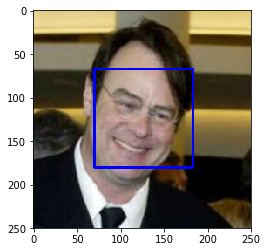

In [10]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [11]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)
Number of faces found in human files short:  98/100
Number of faces found in dog files short:  17/100


In [12]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.

count_faces_in_human_files_short = 0
count_faces_in_dog_files_short = 0

wrong_find_no_faces_in_human_files_short = []
wrong_find_faces_in_dog_files_short = []

for img_path in human_files_short:
    if face_detector(img_path):
        count_faces_in_human_files_short += 1
    else:
        wrong_find_no_faces_in_human_files_short.append(img_path)
        
        
for img_path in dog_files_short:
    if face_detector(img_path):
        count_faces_in_dog_files_short += 1
        wrong_find_faces_in_dog_files_short.append(img_path)
        
        
        
print("Number of faces found in human files short: ", 
      "{}/{}".format(count_faces_in_human_files_short, len(human_files_short)))

print("Number of faces found in dog files short: ", 
      "{}/{}".format(count_faces_in_dog_files_short, len(dog_files_short)))




Number of faces found in human files short:  98/100
Number of faces found in dog files short:  17/100


In [13]:
import torchvision.transforms.functional as TF
img = cv2.imread(human_files_short[0])
print(type(img))


<class 'numpy.ndarray'>


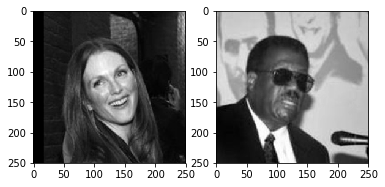

In [14]:
fig = plt.figure()
for ii, img_path in enumerate(wrong_find_no_faces_in_human_files_short):
    img = cv2.imread(img_path)
    cv_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ax = fig.add_subplot(1, len(wrong_find_no_faces_in_human_files_short), ii+1)
    ax.imshow(cv_gray, cmap='gray')


We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

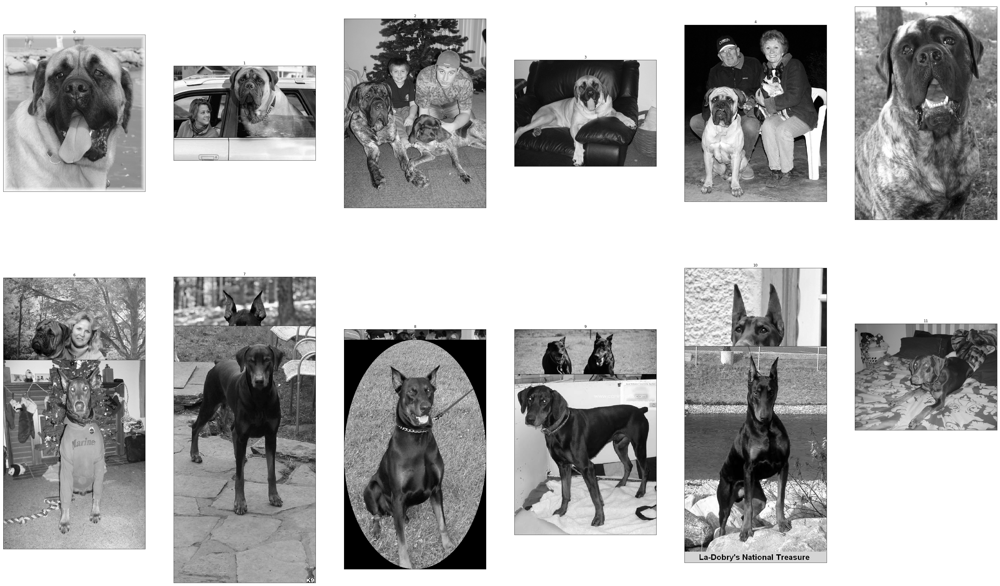

In [15]:
fig = plt.figure(figsize=(60, 60))
for ii, img_path in enumerate(wrong_find_faces_in_dog_files_short):
    img = cv2.imread(img_path)
    cv_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ax = fig.add_subplot(ii / 6 + 1, 6, ii+1, xticks=[], yticks=[], title=str(ii))
    ax.imshow(cv_gray, cmap='gray')

I found 1 face(s) in this photograph.
A face is located at pixel location Top: 80, Left: 67, Bottom: 187, Right: 175


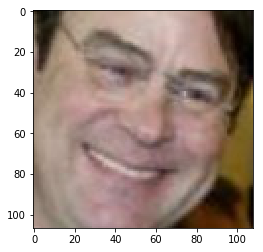

No faces found in image


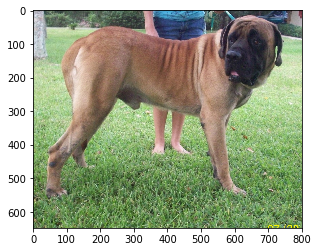

In [17]:
### (Optional) 
### TODO: Test performance of anotherface detection algorithm.
### Feel free to use as many code cells as needed.

# Thanks for the link
# taken from https://github.com/ageitgey/face_recognition
# need run command
# pip install dlib
# pip install git+https://github.com/ageitgey/face_recognition_models


from PIL import Image
import face_recognition

# Load the jpg file into a numpy array
image = face_recognition.load_image_file(human_files[0])

# Find all the faces in the image using the default HOG-based model.
# This method is fairly accurate, but not as accurate as the CNN model and not GPU accelerated.
# See also: find_faces_in_picture_cnn.py
face_locations = face_recognition.face_locations(image)

print("I found {} face(s) in this photograph.".format(len(face_locations)))

for face_location in face_locations:
    # Print the location of each face in this image
    top, right, bottom, left = face_location
    print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
    # You can access the actual face itself like this:
    face_image = image[top:bottom, left:right]
    plt.imshow(face_image)
    plt.show()
    
image = face_recognition.load_image_file(dog_files[0])
face_locations = face_recognition.face_locations(image)

for fl in face_locations:
    # Print the location of each face in this image
    top, right, bottom, left = fl
    print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
    # You can access the actual face itself like this:
    face_image = image[top:bottom, left:right]
    plt.imshow(cv_rgb)
    plt.show()
    
if len(face_locations) == 0:
    print("No faces found in image")
    plt.imshow(image)




In [18]:
def face_detector_2(img_path):
    image = face_recognition.load_image_file(img_path)
    face_locations = face_recognition.face_locations(image)
    return len(face_locations) > 0

In [19]:
count_faces_in_human_files_short = 0
count_faces_in_dog_files_short = 0

wrong_find_no_faces_in_human_files_short = []
wrong_find_faces_in_dog_files_short = []

for img_path in human_files_short:
    if face_detector_2(img_path):
        count_faces_in_human_files_short += 1
    else:
        wrong_find_no_faces_in_human_files_short.append(img_path)
        
        
for img_path in dog_files_short:
    if face_detector_2(img_path):
        count_faces_in_dog_files_short += 1
        wrong_find_faces_in_dog_files_short.append(img_path)
        
        
        
print("Number of faces found in human files short: ", 
      "{}/{}".format(count_faces_in_human_files_short, len(human_files_short)))

print("Number of faces found in dog files short: ", 
      "{}/{}".format(count_faces_in_dog_files_short, len(dog_files_short)))

Number of faces found in human files short:  100/100
Number of faces found in dog files short:  8/100


---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [20]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.torch/models/vgg16-397923af.pth
100%|██████████| 553433881/553433881 [00:05<00:00, 101448297.36it/s]


Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [21]:
for param in VGG16.features.parameters():
    param.requires_grad = False
    

In [22]:
from PIL import Image
import torchvision.transforms as transforms
from torchvision import datasets
import torchvision.transforms.functional as TF
from skimage import io, transform

def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    VGG16.eval()
    img = Image.open(img_path)    
    
    transform = transforms.Compose([#transforms.Resize(250),
                                    transforms.RandomResizedCrop(224),
                                    transforms.ToTensor(),
                                   transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])          
        
    img_t = transform(img)
    
    img_t = img_t.unsqueeze(0) 
    
    if torch.cuda.is_available():
        img_t = img_t.cuda()    
    
    prediction = VGG16(img_t)
    
    _, output_ind = torch.max(prediction, 1)
    
    return output_ind.item() # predicted class index

243


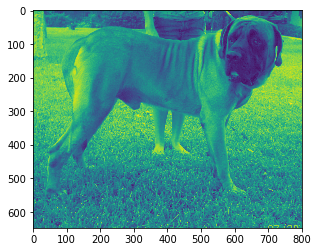

In [23]:
result = VGG16_predict(dog_files_short[0])
print(result)
img = cv2.imread(dog_files_short[0])    
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
plt.imshow(gray)

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [24]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    predict = VGG16_predict(img_path)
    return predict >= 151 and predict <= 268 # true/false

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 
VGG16
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100

densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  100/100

alexnet
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100

resnet50
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  100/100

In [25]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
count_dog_in_human_files_short = 0
count_dog_in_dog_files_short = 0

wrong_find_dog_in_human_files_short = []
wrong_find_no_dog_in_dog_files_short = []

for img_path in human_files_short:
    if dog_detector(img_path):
        count_dog_in_human_files_short += 1
        wrong_find_dog_in_human_files_short.append(img_path)
        
        
for img_path in dog_files_short:
    if dog_detector(img_path):
        count_dog_in_dog_files_short += 1
    else:
        wrong_find_no_dog_in_dog_files_short.append(img_path)
        
        
        
print("Number of dog found in human files short: ", 
      "{}/{}".format(count_dog_in_human_files_short, len(human_files_short)))

print("Number of dog found in dog files short: ", 
      "{}/{}".format(count_dog_in_dog_files_short, len(dog_files_short)))

Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [26]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.

def predict_func(img_path, select_func):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    
    select_func.eval()
    img = Image.open(img_path)    
    
    
    transform = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224), 
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]) 
        
    img_t = transform(img)    
    img_t = img_t.unsqueeze(0) 
    
    if torch.cuda.is_available():
        img_t = img_t.cuda()
        select_func = select_func.cuda()    
    
    prediction = select_func(img_t)
    _, output_ind = torch.max(prediction, 1)
    
    return output_ind.item() # predicted class index

In [27]:
def dog_detector_2(img_path, sf):
    ## TODO: Complete the function.
    predict = predict_func(img_path, sf)
    return predict >= 151 and predict <= 268 # true/false

In [28]:
def calc_100(sf):

    count_dog_in_human_files_short = 0
    count_dog_in_dog_files_short = 0

    wrong_find_dog_in_human_files_short = []
    wrong_find_no_dog_in_dog_files_short = []

    for img_path in human_files_short:
        if dog_detector_2(img_path, sf):
            count_dog_in_human_files_short += 1
            wrong_find_dog_in_human_files_short.append(img_path)


    for img_path in dog_files_short:
        if dog_detector_2(img_path, sf):
            count_dog_in_dog_files_short += 1
        else:
            wrong_find_no_dog_in_dog_files_short.append(img_path)



    print("Number of dog found in human files short: ", 
          "{}/{}".format(count_dog_in_human_files_short, len(human_files_short)))

    print("Number of dog found in dog files short: ", 
          "{}/{}".format(count_dog_in_dog_files_short, len(dog_files_short)))

In [29]:
densenet161 = models.densenet161(pretrained=True)
for param in densenet161.features.parameters():
    param.requires_grad = False

alexnet = models.alexnet(pretrained=True)
for param in alexnet.features.parameters():
    param.requires_grad = False
    
resnet50 = models.resnet50(pretrained=True)
for param in resnet50.parameters():
    param.requires_grad = False

/opt/conda/lib/python3.6/site-packages/torchvision-0.2.1-py3.6.egg/torchvision/models/densenet.py:212: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
Downloading: "https://download.pytorch.org/models/densenet161-8d451a50.pth" to /root/.torch/models/densenet161-8d451a50.pth
100%|██████████| 115730790/115730790 [00:01<00:00, 85649131.62it/s]
Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.torch/models/alexnet-owt-4df8aa71.pth
100%|██████████| 244418560/244418560 [00:02<00:00, 101942627.20it/s]
Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.torch/models/resnet50-19c8e357.pth
100%|██████████| 102502400/102502400 [00:04<00:00, 22145838.80it/s]


In [30]:
result = predict_func(dog_files_short[0], densenet161) 
print("result densenet161= ", result, ", path= ", dog_files_short[0])

result = predict_func(dog_files_short[0], alexnet) 
print("result alexnet= ", result, ", path= ", dog_files_short[0])

# result = VGG16_predict(dog_files_short[0])
result = predict_func(dog_files_short[0], VGG16) 
print("VGG16 predict= ", result, ", path= ", dog_files_short[0])

result = predict_func(dog_files_short[0], resnet50) 
print("result resnet50= ", result, ", path= ", dog_files_short[0])

result densenet161=  243 , path=  /data/dog_images/train/103.Mastiff/Mastiff_06833.jpg
result alexnet=  243 , path=  /data/dog_images/train/103.Mastiff/Mastiff_06833.jpg
VGG16 predict=  243 , path=  /data/dog_images/train/103.Mastiff/Mastiff_06833.jpg
result resnet50=  243 , path=  /data/dog_images/train/103.Mastiff/Mastiff_06833.jpg


In [31]:
print("densenet161")
calc_100(densenet161)

densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  100/100


In [32]:
print("alexnet")
calc_100(alexnet)

alexnet
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100


In [33]:
print("resnet50")
calc_100(resnet50)

resnet50
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  100/100


In [22]:
%%timeit
print("densenet161")
calc_100(densenet161)
# When using pre-cropping up to 250 changes not found

densenet161 with resize
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  97/100
densenet161 with resize
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  98/100
densenet161 with resize
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
densenet161 with resize
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  97/100
densenet161 with resize
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  98/100
densenet161 with resize
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  98/100
densenet161 with resize
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
densenet161 with resize
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
14.1 s ± 34.7 ms per loop (mean 

In [21]:
%%timeit
print("densenet161")
calc_100(densenet161)

densenet161
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  97/100
densenet161
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  98/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  100/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  98/100
densenet161
Number of dog found in human files short:  4/100
Number of dog found in dog files short:  96/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100
densenet161
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  100/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  98/100
14.5 s ± 74.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [23]:
%%timeit
print("VGG16")
calc_100(VGG16, True)

VGG16
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
VGG16
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
VGG16
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  97/100
VGG16
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  95/100
VGG16
Number of dog found in human files short:  3/100
Number of dog found in dog files short:  97/100
VGG16
Number of dog found in human files short:  3/100
Number of dog found in dog files short:  100/100
VGG16
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  97/100
VGG16
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  98/100
7.39 s ± 30.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [25]:
%%timeit
print("densenet161")
calc_100(densenet161)

densenet161
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  97/100
densenet161
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  98/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  98/100
densenet161
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  100/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  100/100
densenet161
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  98/100
densenet161
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100
densenet161
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  98/100
14.4 s ± 15.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [28]:
%%timeit
print("alexnet")
calc_100(alexnet)

alexnet
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  93/100
alexnet
Number of dog found in human files short:  3/100
Number of dog found in dog files short:  93/100
alexnet
Number of dog found in human files short:  4/100
Number of dog found in dog files short:  94/100
alexnet
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  96/100
alexnet
Number of dog found in human files short:  5/100
Number of dog found in dog files short:  89/100
alexnet
Number of dog found in human files short:  7/100
Number of dog found in dog files short:  96/100
alexnet
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  97/100
alexnet
Number of dog found in human files short:  5/100
Number of dog found in dog files short:  97/100
2.88 s ± 15.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [29]:
%%timeit
print("resnet50")
calc_100(resnet50)

resnet50
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  97/100
resnet50
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  98/100
resnet50
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  96/100
resnet50
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  98/100
resnet50
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
resnet50
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  99/100
resnet50
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
resnet50
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  95/100
5.46 s ± 20.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [24]:
%%timeit
print("VGG16")
calc_100(VGG16)

VGG16
Number of dog found in human files short:  4/100
Number of dog found in dog files short:  98/100
VGG16
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  97/100
VGG16
Number of dog found in human files short:  1/100
Number of dog found in dog files short:  95/100
VGG16
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  100/100
VGG16
Number of dog found in human files short:  3/100
Number of dog found in dog files short:  95/100
VGG16
Number of dog found in human files short:  2/100
Number of dog found in dog files short:  99/100
VGG16
Number of dog found in human files short:  4/100
Number of dog found in dog files short:  97/100
VGG16
Number of dog found in human files short:  0/100
Number of dog found in dog files short:  100/100
7.73 s ± 22.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dog_images/train`, `dog_images/valid`, and `dog_images/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [34]:
import os, torch
from torchvision import datasets, transforms
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes
# transforms.Resize(250),
transform_train = transforms.Compose([    
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

transform_test_valid = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),    
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

train_data = datasets.ImageFolder('/data/dog_images/train', transform=transform_train)
test_data = datasets.ImageFolder('/data/dog_images/test', transform=transform_test_valid)
valid_data = datasets.ImageFolder('/data/dog_images/valid', transform=transform_test_valid)

batch_size = 6


train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

loaders_scratch = {
    'train': train_loader,
    'valid': valid_loader,
    'test' : test_loader
}

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:
For training I use following transformation:
resize, horizontal flip, rotation and normalization
For test and valid data I use following transformation:
resize and normalization
1) I use size 224 since this size is accepted by most models
2) I supplement the training-only kit, it’s horizontal flip and random rotation
I use random cropping to 224

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [35]:
import torch.nn as nn
import torch.nn.functional as F

use_cuda = torch.cuda.is_available()

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.bnorm2d_1 = nn.BatchNorm2d(32)
        
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.bnorm2d_2 = nn.BatchNorm2d(64)
        
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv6 = nn.Conv2d(128, 128, 3, padding=1)
        self.bnorm2d_3 = nn.BatchNorm2d(128)
        
        self.conv7 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv8 = nn.Conv2d(256, 256, 3, padding=1)
        self.bnorm2d_4 = nn.BatchNorm2d(256)
        
        self.conv9 = nn.Conv2d(256, 512, 3, padding=1)
        self.conv10 = nn.Conv2d(512, 512, 3, padding=1)
        self.bnorm2d_5 = nn.BatchNorm2d(512)
        
        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(25088, 4096, bias=False)
        self.fc2 = nn.Linear(4096, 4096, bias=False)
        self.fc3 = nn.Linear(4096, 133, bias=False)
        
    
    def forward(self, x):
        ## Define forward behavior
        
        x = F.relu(self.conv1(x)) #224*224*32
        x = self.pool(F.relu(self.bnorm2d_1(self.conv2(x)))) #112*112*32        
        
        x = F.relu(self.conv3(x)) #112*112*64
        x = self.pool(F.relu(self.bnorm2d_2(self.conv4(x)))) #56*56*64
        
        x = F.relu(self.conv5(x))#56*56*128
        x = self.pool(F.relu(self.bnorm2d_3(self.conv6(x)))) #28*28*128
        
        x = F.relu(self.conv7(x)) #28*28*256
        x = self.pool(F.relu(self.bnorm2d_4(self.conv8(x)))) #14*14*256
        
        x = F.relu(self.conv9(x)) #14*14*512
        x = self.pool(F.relu(self.bnorm2d_5(self.conv10(x)))) #7*7*512 = 25088      
        
        x = x.view(-1, 25088)
        
        x = F.dropout(F.relu(self.fc1(x)), p=0.5)
        x = F.dropout(F.relu(self.fc2(x)), p=0.5)
        x = self.fc3(x)
        
        return x 

class Net3(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net3, self).__init__()
        ## Define layers of a CNN
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.bnorm2d_1 = nn.BatchNorm2d(32)
        
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.bnorm2d_2 = nn.BatchNorm2d(64)
        
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv6 = nn.Conv2d(128, 128, 3, padding=1)
        self.bnorm2d_3 = nn.BatchNorm2d(128)
        
        self.conv7 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv8 = nn.Conv2d(256, 256, 3, padding=1)
        self.bnorm2d_4 = nn.BatchNorm2d(256)
        
        self.conv9 = nn.Conv2d(256, 512, 3, padding=1)
        self.conv10 = nn.Conv2d(512, 512, 3, padding=1)
        self.bnorm2d_5 = nn.BatchNorm2d(512)
        
        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(25088, 4096, bias=False)
        self.fc2 = nn.Linear(4096, 4096, bias=False)
        self.fc3 = nn.Linear(4096, 1000, bias=False)
        
    
    def forward(self, x):
        ## Define forward behavior
        
        x = F.relu(self.conv1(x)) #224*224*32
        x = self.pool(F.relu(self.bnorm2d_1(self.conv2(x)))) #112*112*32        
        
        x = F.relu(self.conv3(x)) #112*112*64
        x = self.pool(F.relu(self.bnorm2d_2(self.conv4(x)))) #56*56*64
        
        x = F.relu(self.conv5(x))#56*56*128
        x = self.pool(F.relu(self.bnorm2d_3(self.conv6(x)))) #28*28*128
        
        x = F.relu(self.conv7(x)) #28*28*256
        x = self.pool(F.relu(self.bnorm2d_4(self.conv8(x)))) #14*14*256
        
        x = F.relu(self.conv9(x)) #14*14*512
        x = self.pool(F.relu(self.bnorm2d_5(self.conv10(x)))) #7*7*512 = 25088      
        
        x = x.view(-1, 25088)
        
        x = F.dropout(F.relu(self.fc1(x)), p=0.5)
        x = F.dropout(F.relu(self.fc2(x)), p=0.5)
        x = self.fc3(x)
        
        return x 

class Net2(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net2, self).__init__()
        ## Define layers of a CNN
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv6 = nn.Conv2d(128, 128, 3, padding=1)
        
        self.conv7 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv8 = nn.Conv2d(256, 256, 3, padding=1)
        
        self.conv9 = nn.Conv2d(256, 512, 3, padding=1)
        self.conv10 = nn.Conv2d(512, 512, 3, padding=1)
        
        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(25088, 4096)
        self.fc2 = nn.Linear(4096, 4096)
        self.fc3 = nn.Linear(4096, 1000)
        
    
    def forward(self, x):
        ## Define forward behavior
        
        x = F.relu(self.conv1(x)) #224*224*32
        x = self.pool(F.relu(self.conv2(x))) #112*112*32        
        
        x = F.relu(self.conv3(x)) #112*112*64
        x = self.pool(F.relu(self.conv4(x))) #56*56*64
        
        x = F.relu(self.conv5(x))#56*56*128
        x = self.pool(F.relu(self.conv6(x))) #28*28*128
        
        x = F.relu(self.conv7(x)) #28*28*256
        x = self.pool(F.relu(self.conv8(x))) #14*14*256
        
        x = F.relu(self.conv9(x)) #14*14*512
        x = self.pool(F.relu(self.conv10(x))) #7*7*512 = 25088      
        
        x = x.view(-1, 25088)
        
        x = F.dropout(F.relu(self.fc1(x)), p=0.25)
        x = F.dropout(F.relu(self.fc2(x)), p=0.25)
        x = self.fc3(x)
        
        return x 


class Net1(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net1, self).__init__()
        ## Define layers of a CNN
        self.conv1 = nn.Conv2d(3, 64, 3, padding=1)
        self.conv2 = nn.Conv2d(64, 64, 3, padding=1)
        
        self.bnorm2d_1 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv4 = nn.Conv2d(128, 128, 3, padding=1)
        self.bnorm2d_2 = nn.BatchNorm2d(128)
        
        self.conv5 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv6 = nn.Conv2d(256, 256, 3, padding=1)
        
        self.conv7 = nn.Conv2d(256, 128, 3, padding=1)
        self.conv8 = nn.Conv2d(128, 128, 3, padding=1)
        
        self.conv9 = nn.Conv2d(128, 64, 3, padding=1)
        self.conv10 = nn.Conv2d(64, 64, 3, padding=1)
        
        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(3136, 1568, bias=False)
        self.fc2 = nn.Linear(1568, 1568, bias=False)
        self.fc3 = nn.Linear(1568, 1000, bias=False)
        
    
    def forward(self, x):
        ## Define forward behavior
        
        x = F.relu(self.conv1(x)) #224*224*64
        x = self.pool(F.relu(self.bnorm2d_1(self.conv2(x)))) #112*112*64     
#         x = self.pool(F.relu(self.conv2(x))) #112*112*64        
        
        x = F.relu(self.conv3(x)) #112*112*128
        x = self.pool(F.relu(self.bnorm2d_2(self.conv4(x)))) #56*56*128
        
        x = F.relu(self.conv5(x))#56*56*256
        x = self.pool(F.relu(self.conv6(x))) #28*28*256
        
        x = F.relu(self.conv7(x)) #28*28*128
        x = self.pool(F.relu(self.conv8(x))) #14*14*128
        
        x = F.relu(self.conv9(x)) #14*14*64
        x = self.pool(F.relu(self.conv10(x))) #7*7*64 = 3136      
        
        x = x.view(-1, 3136)
        
        x = F.dropout(F.relu(self.fc1(x)), p=0.5)
        x = F.dropout(F.relu(self.fc2(x)), p=0.5)
        x = self.fc3(x)
        
        return x 

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ I studied various models: vgg16, densenet161, resnet.  First I created convolutional layers, then fully related layers. Reduced the number of layers from 16 to 10. In my first versions I used only Conv2d. Then I added BatchNorm2d. With her, neural network training accelerated

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [36]:
import torch.optim as optim
import numpy as np
### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01) #change lr for fast learning
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer_scratch, 'max', patience=9, factor=0.5, verbose=True)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [37]:
import time
from workspace_utils import keep_awake
from workspace_utils import active_session

print_every = 200

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path, default_min=np.Inf):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = default_min 
    start = time.time()
        
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            output = model(data)
            loss = criterion(output, target)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_loss += (1 / (batch_idx + 1)) * (loss.data - train_loss)
            
            if (batch_idx+1)%print_every==0:
                print("batch_idx: {}, train loss: {:.3f}, time: {:.3f}".format(batch_idx+1, train_loss, 
                                                                              time.time()-start))           
            
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            output = model(data)
            loss = criterion(output, target)
            valid_loss += (1 / (batch_idx + 1)) * (loss.data - valid_loss)
            
            if (batch_idx+1)%print_every==0:
                print("batch_idx: {}, valid loss: {:.3f}, time: {:.3f}".format(batch_idx+1, valid_loss, 
                                                                              time.time()-start))

            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}, time= {:.3f}'.format(
            epoch, 
            train_loss,
            valid_loss,
            time.time()-start
            ))
        
        ## TODO: save the model if validation loss has decreased
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_loss_min,
            valid_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
        
        scheduler.step(valid_loss)               
        
            
    # return trained model
    return model


In [38]:
# train the model
# for i in keep_awake(range(5)):
with active_session():
#     print("one run")
    model_scratch = train(100, loaders_scratch, model_scratch, optimizer_scratch, 
                          criterion_scratch, use_cuda, 'model_scratch.pt') #1.707391
    model_scratch.load_state_dict(torch.load('model_scratch.pt'))
    test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)
    

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))



batch_idx: 200, train loss: 1.596, time: 32.979
batch_idx: 400, train loss: 1.615, time: 66.816
batch_idx: 600, train loss: 1.648, time: 100.386
batch_idx: 800, train loss: 1.652, time: 133.000
batch_idx: 1000, train loss: 1.661, time: 166.172
Epoch: 1 	Training Loss: 1.650430 	Validation Loss: 1.453572, time= 195.189
Validation loss decreased (1.707391 --> 1.453572).  Saving model ...
batch_idx: 200, train loss: 1.593, time: 228.821
batch_idx: 400, train loss: 1.654, time: 262.058
batch_idx: 600, train loss: 1.638, time: 295.051
batch_idx: 800, train loss: 1.641, time: 327.930
batch_idx: 1000, train loss: 1.665, time: 360.837
Epoch: 2 	Training Loss: 1.667125 	Validation Loss: 1.330668, time= 390.072
Validation loss decreased (1.453572 --> 1.330668).  Saving model ...
batch_idx: 200, train loss: 1.624, time: 423.789
batch_idx: 400, train loss: 1.632, time: 456.635
batch_idx: 600, train loss: 1.632, time: 490.245
batch_idx: 800, train loss: 1.633, time: 523.236
batch_idx: 1000, train l

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [38]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))
    
model_scratch.load_state_dict(torch.load('model_scratch.pt'))
# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 1.204683


Test Accuracy: 65% (550/836)


1 run (36 epochs) - Test loss 3.328 - Test Accuracy: 43%
2 run (36 epochs) - Test loss 2.254 - Test Accuracy: 43% (363/836)
3 run (36 epochs) - Test Loss: 1.818414 - Test Accuracy: 52% (438/836)

I mistakenly did not specify the number of outputs in the output layer. Trained about 100 epochs. Reached accuracy of 52%. After I pointed out that the number of exits is equal to 133. The speed of learning has increased many times. Because of this error, I studied various classes that dynamically change the learning speed, studied the BatchNorm2d method.
In the latter version, with the number of exits 133, I made 65% accuracy after 60 epochs. (one run (50 epochs) -54%, two run (10 epochs) - 65%)

---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [39]:
## TODO: Specify data loaders
import torch
import numpy as np
import os, torch
from torchvision import datasets, transforms
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes
# transforms.Resize(250),
transform_train = transforms.Compose([    
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

transform_test_valid = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])      
    ])

train_data = datasets.ImageFolder('/data/dog_images/train', transform=transform_train)
test_data = datasets.ImageFolder('/data/dog_images/test', transform=transform_test_valid)
valid_data = datasets.ImageFolder('/data/dog_images/valid', transform=transform_test_valid)

batch_size = 6


train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

loaders_transfer = {
    'train': train_loader,
    'valid': valid_loader,
    'test' : test_loader
}

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [40]:
import torchvision.models as models
import torch.nn as nn
use_cuda = torch.cuda.is_available()
## TODO: Specify model architecture 
model_transfer = models.densenet161(pretrained=True)
for param in model_transfer.features.parameters():
    param.requires_grad = False

if use_cuda:
    model_transfer = model_transfer.cuda()

/opt/conda/lib/python3.6/site-packages/torchvision-0.2.1-py3.6.egg/torchvision/models/densenet.py:212: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.


In [42]:
model_transfer.classifier.out_features = 133


__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 
I chose this model densenet161 because it is well suited for classifying images and it has good accuracy. I changed the number of outputs from 1000 to 133

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [43]:
import torch.optim as optim

criterion_transfer = nn.CrossEntropyLoss()
optimizer_transfer = optim.SGD(model_transfer.classifier.parameters(), lr=0.01) #change lr for fast learning
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer_transfer, 'max', patience=9, factor=0.5, verbose=True)



### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [24]:
# train the model
n_epochs = 20
with active_session():
    model_transfer = train(n_epochs, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')

# load the model that got the best validation accuracy (uncomment the line below)
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

batch_idx: 200, train loss: 4.887, time: 37.044
batch_idx: 400, train loss: 4.674, time: 73.734
batch_idx: 600, train loss: 4.448, time: 110.526
batch_idx: 800, train loss: 4.210, time: 147.351
batch_idx: 1000, train loss: 4.023, time: 183.851
Epoch: 1 	Training Loss: 3.932722 	Validation Loss: 2.393567, time= 229.013
Validation loss decreased (inf --> 2.393567).  Saving model ...
batch_idx: 200, train loss: 2.825, time: 266.116
batch_idx: 400, train loss: 2.756, time: 303.120
batch_idx: 600, train loss: 2.701, time: 339.840
batch_idx: 800, train loss: 2.637, time: 376.747
batch_idx: 1000, train loss: 2.593, time: 413.191
Epoch: 2 	Training Loss: 2.565521 	Validation Loss: 1.420864, time= 458.514
Validation loss decreased (2.393567 --> 1.420864).  Saving model ...
batch_idx: 200, train loss: 2.196, time: 496.058
batch_idx: 400, train loss: 2.122, time: 532.389
batch_idx: 600, train loss: 2.087, time: 569.068
batch_idx: 800, train loss: 2.058, time: 605.962
batch_idx: 1000, train loss: 

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [44]:
model_transfer.load_state_dict(torch.load('model_transfer.pt'))
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.418014


Test Accuracy: 86% (722/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [45]:
# list of class names by index, i.e. a name can be accessed like class_names[0]
data_transfer = loaders_transfer.copy()
class_names = [item[4:].replace("_", " ") for item in data_transfer['train'].dataset.classes]

In [46]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
from PIL import Image
import torchvision.transforms as transforms

def predict_breed_transfer(img_path):
    model_transfer.eval()
    img = Image.open(img_path)
    transform = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])    
    image_t = transform(img).unsqueeze(0)
    if torch.cuda.is_available():
        image_t = image_t.cuda()  
    
    prediction = model_transfer(image_t)
    
    _, output_ind = torch.max(prediction, 1)
    
    return output_ind.item()

In [47]:
import numpy as np
from glob import glob
human_files = np.array(glob("/data/lfw/*/*"))
dog_files = np.array(glob("/data/dog_images/*/*/*"))

indices = list(range(len(dog_files)))
np.random.shuffle(indices)

print("dog files")
for i in range(len(indices)):
    if i == 20:
        break
    img_path = dog_files[indices[i]]
    predict_index = predict_breed_transfer(img_path)
    print("Predict=", class_names[predict_index])
    print("Path=", img_path)
    print("")

indices_h = list(range(len(human_files)))
np.random.shuffle(indices_h)
print("humans files")
for i in range(len(indices_h)):
    if i == 20:
        break
    img_path = human_files[indices[i]]
    predict_index = predict_breed_transfer(img_path)
    if (predict_index < len(class_names)):
        print("Predict=", class_names[predict_index])
        print("Path=", img_path)
    else:
        print("index more than class names: ", predict_index)
    print("")


    



dog files
Predict= Curly-coated retriever
Path= /data/dog_images/train/055.Curly-coated_retriever/Curly-coated_retriever_03914.jpg

Predict= Bichon frise
Path= /data/dog_images/valid/024.Bichon_frise/Bichon_frise_01748.jpg

Predict= Leonberger
Path= /data/dog_images/train/098.Leonberger/Leonberger_06563.jpg

Predict= Poodle
Path= /data/dog_images/train/124.Poodle/Poodle_07954.jpg

Predict= German shepherd dog
Path= /data/dog_images/train/071.German_shepherd_dog/German_shepherd_dog_04907.jpg

Predict= Dogue de bordeaux
Path= /data/dog_images/train/060.Dogue_de_bordeaux/Dogue_de_bordeaux_04228.jpg

Predict= Airedale terrier
Path= /data/dog_images/train/003.Airedale_terrier/Airedale_terrier_00167.jpg

Predict= Border terrier
Path= /data/dog_images/test/030.Border_terrier/Border_terrier_02141.jpg

Predict= Beauceron
Path= /data/dog_images/train/018.Beauceron/Beauceron_01308.jpg

Predict= Bullmastiff
Path= /data/dog_images/valid/041.Bullmastiff/Bullmastiff_02897.jpg

Predict= Briard
Path= /

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `human_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [48]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

def run_app(img_path, vers2 = False):
    #check
    
    print("------------------------------")
    img = Image.open(img_path)
    plt.imshow(img)
    plt.show()
    print("Path:", img_path)
    if vers2:
        is_human_faces = face_detector_2(img_path)
    else:
        is_human_faces = face_detector(img_path)
    is_dog = dog_detector_2(img_path, densenet161) 
    if is_human_faces > 0:
        print("human face(s) detected in image")
        
    if is_dog:
        print("Dog detected on image")
        predict_index = predict_breed_transfer(img_path)
        print("Dog breed: ", class_names[predict_index])
        
    if not(is_human_faces or is_dog):
        print("There is no human and dog in the image.") 
        
    print("-------------------------------")
    


---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ (Three possible points for improvement)
1) Increase the number of eras to increase accuracy, now 85% accuracy
2) You can also use more images for training. I also used model training augmentation. This type of data augmentation should add some positional variety to these images. 
3) I also dynamically changed the learning speed
4) You can also try using Capsule Neural Network. 

------------------------------


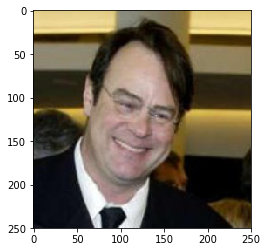

Path: /data/lfw/Dan_Ackroyd/Dan_Ackroyd_0001.jpg
human face(s) detected in image
-------------------------------
------------------------------


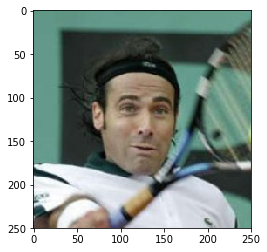

Path: /data/lfw/Alex_Corretja/Alex_Corretja_0001.jpg
human face(s) detected in image
-------------------------------
------------------------------


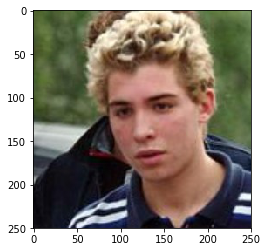

Path: /data/lfw/Daniele_Bergamin/Daniele_Bergamin_0001.jpg
human face(s) detected in image
-------------------------------
------------------------------


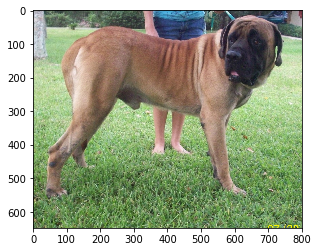

Path: /data/dog_images/train/103.Mastiff/Mastiff_06833.jpg
Dog detected on image
Dog breed:  Mastiff
-------------------------------
------------------------------


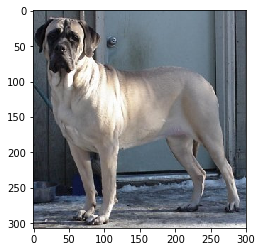

Path: /data/dog_images/train/103.Mastiff/Mastiff_06826.jpg
Dog detected on image
Dog breed:  Mastiff
-------------------------------
------------------------------


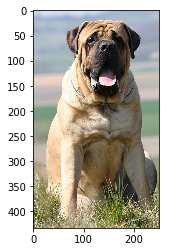

Path: /data/dog_images/train/103.Mastiff/Mastiff_06871.jpg
Dog detected on image
Dog breed:  Bullmastiff
-------------------------------
Duration= 3.34320068359375


In [49]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
start = time.time()
for file in np.hstack((human_files[:3], dog_files[:3])):
    run_app(file)

print("Duration=", time.time()-start)

------------------------------


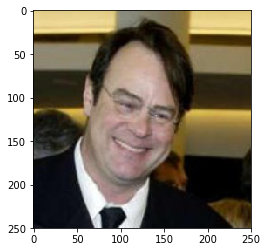

Path: /data/lfw/Dan_Ackroyd/Dan_Ackroyd_0001.jpg
human face(s) detected in image
-------------------------------
------------------------------


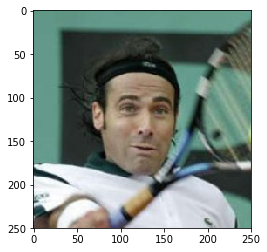

Path: /data/lfw/Alex_Corretja/Alex_Corretja_0001.jpg
human face(s) detected in image
-------------------------------
------------------------------


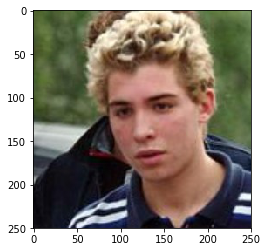

Path: /data/lfw/Daniele_Bergamin/Daniele_Bergamin_0001.jpg
human face(s) detected in image
-------------------------------
------------------------------


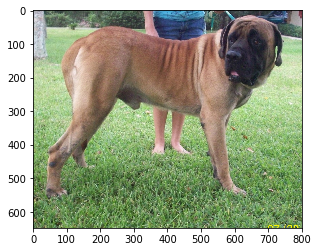

Path: /data/dog_images/train/103.Mastiff/Mastiff_06833.jpg
Dog detected on image
Dog breed:  Mastiff
-------------------------------
------------------------------


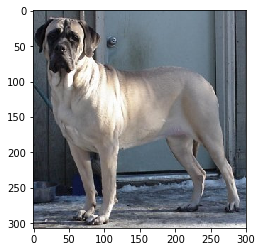

Path: /data/dog_images/train/103.Mastiff/Mastiff_06826.jpg
Dog detected on image
Dog breed:  Mastiff
-------------------------------
------------------------------


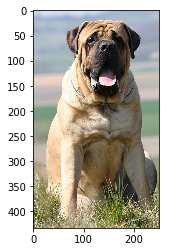

Path: /data/dog_images/train/103.Mastiff/Mastiff_06871.jpg
Dog detected on image
Dog breed:  Bullmastiff
-------------------------------
Duration= 3.59390926361084


In [50]:
start = time.time()
for file in np.hstack((human_files[:3], dog_files[:3])):
    run_app(file, True)

print("Duration=", time.time()-start)

------------------------------


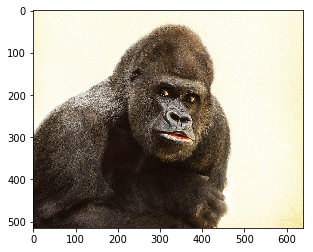

Path: ./my_images/gorilla-448731_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


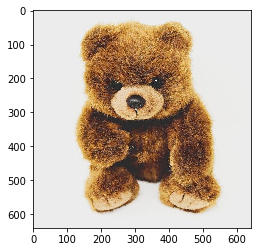

Path: ./my_images/teddy-5070083_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


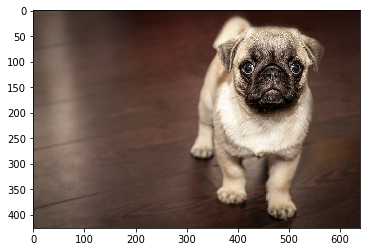

Path: ./my_images/pug-690566_640.jpg
Dog detected on image
Dog breed:  French bulldog
-------------------------------
------------------------------


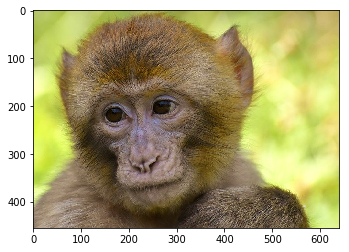

Path: ./my_images/barbary-ape-3562358_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


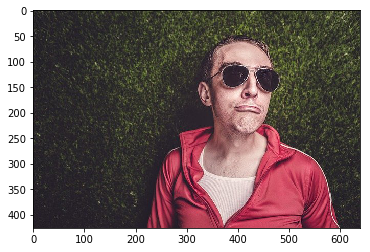

Path: ./my_images/man-930397_640.jpg
human face(s) detected in image
-------------------------------
------------------------------


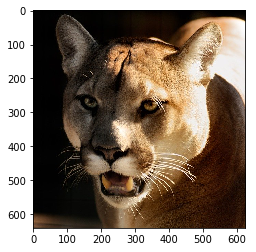

Path: ./my_images/cougar-2873099_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


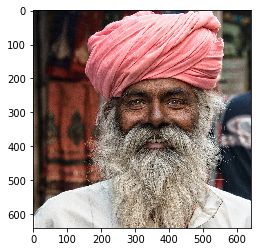

Path: ./my_images/human-613601_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


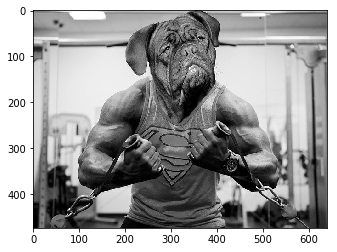

Path: ./my_images/bordeaux-963810_640.jpg
human face(s) detected in image
Dog detected on image
Dog breed:  Dogue de bordeaux
-------------------------------
------------------------------


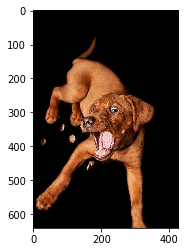

Path: ./my_images/dog-5021242_640.jpg
Dog detected on image
Dog breed:  Dogue de bordeaux
-------------------------------
------------------------------


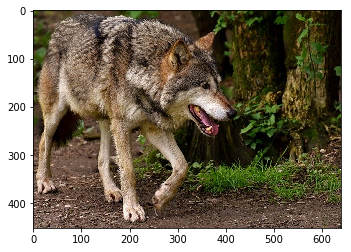

Path: ./my_images/wolf-3151876_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


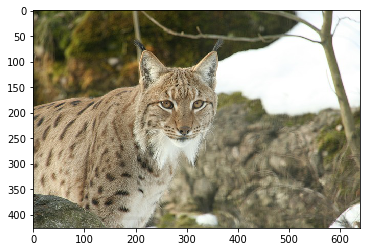

Path: ./my_images/lynx-940357_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


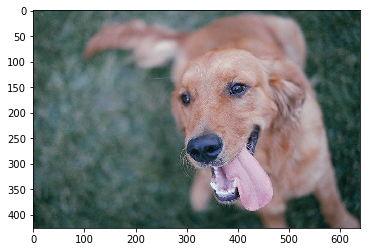

Path: ./my_images/dog-867236_640.jpg
Dog detected on image
Dog breed:  Golden retriever
-------------------------------
------------------------------


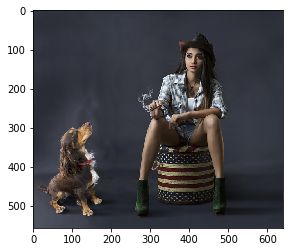

Path: ./my_images/fashion-3169951_640.jpg
human face(s) detected in image
Dog detected on image
Dog breed:  Dachshund
-------------------------------
------------------------------


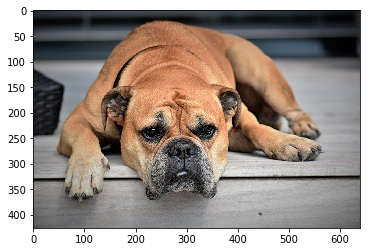

Path: ./my_images/dog-2437110_640.jpg
Dog detected on image
Dog breed:  Bulldog
-------------------------------
------------------------------


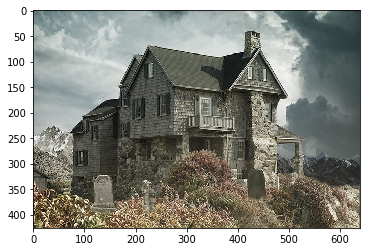

Path: ./my_images/house-2187170_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


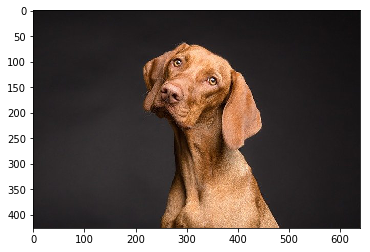

Path: ./my_images/dog-3277416_640.jpg
Dog detected on image
Dog breed:  Dogue de bordeaux
-------------------------------
------------------------------


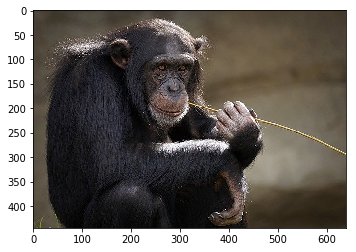

Path: ./my_images/chimpanzee-3703230_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


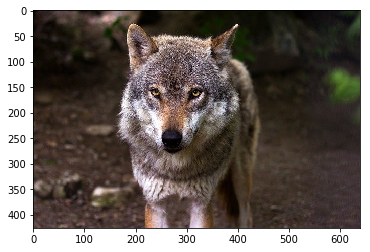

Path: ./my_images/wolf-635063_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


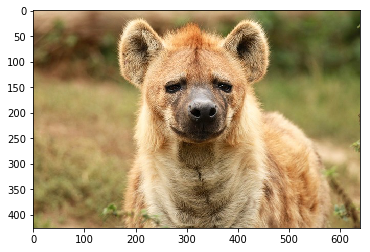

Path: ./my_images/hyena-3681274_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


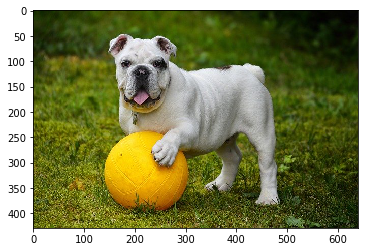

Path: ./my_images/english-bulldog-562723_640.jpg
Dog detected on image
Dog breed:  Bulldog
-------------------------------
------------------------------


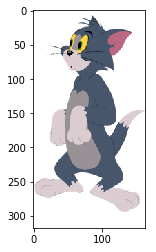

Path: ./my_images/tom.png
There is no human and dog in the image.
-------------------------------
------------------------------


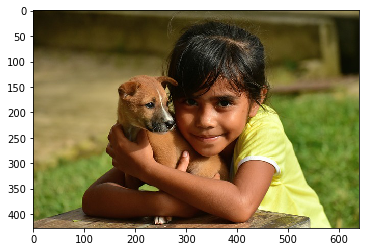

Path: ./my_images/puppy-3074154_640.jpg
human face(s) detected in image
-------------------------------
------------------------------


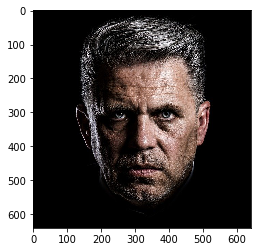

Path: ./my_images/man-852762_640.jpg
human face(s) detected in image
-------------------------------
------------------------------


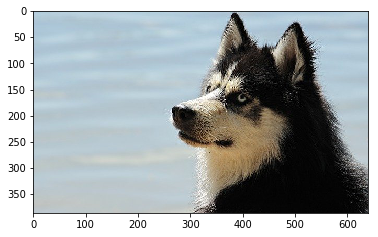

Path: ./my_images/husky-3380550_640.jpg
Dog detected on image
Dog breed:  Alaskan malamute
-------------------------------
------------------------------


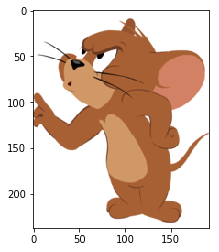

Path: ./my_images/jerry.png
There is no human and dog in the image.
-------------------------------
------------------------------


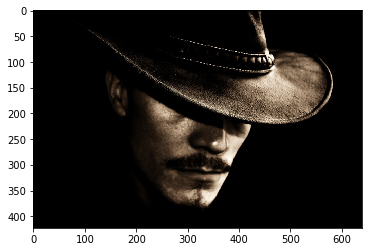

Path: ./my_images/man-20404_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------
error loading image:  ./my_images/.ipynb_checkpoints


In [51]:
import os
my_images = "./my_images"
for img_file in os.listdir(my_images):
    img_path = os.path.join(my_images, img_file)
    try:
        run_app(img_path)    
    except:
        print("error loading image: ", img_path)

------------------------------


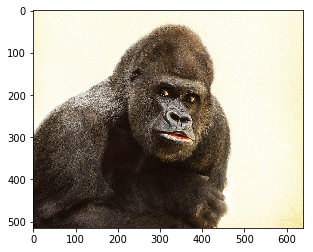

Path: ./my_images/gorilla-448731_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


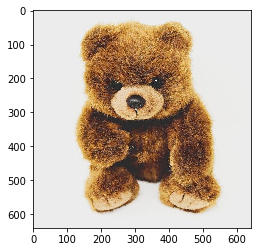

Path: ./my_images/teddy-5070083_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


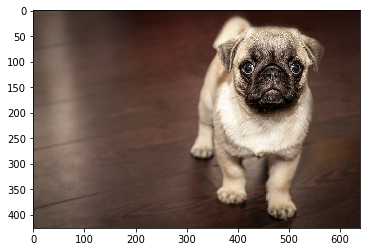

Path: ./my_images/pug-690566_640.jpg
Dog detected on image
Dog breed:  French bulldog
-------------------------------
------------------------------


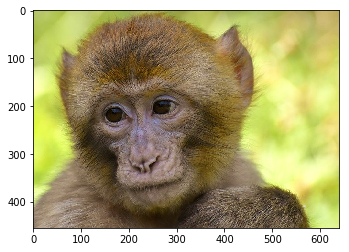

Path: ./my_images/barbary-ape-3562358_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


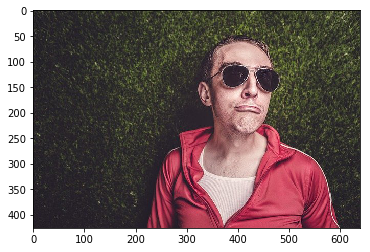

Path: ./my_images/man-930397_640.jpg
human face(s) detected in image
-------------------------------
------------------------------


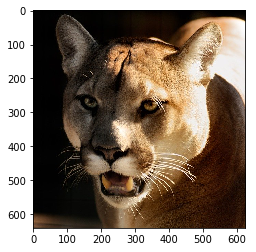

Path: ./my_images/cougar-2873099_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


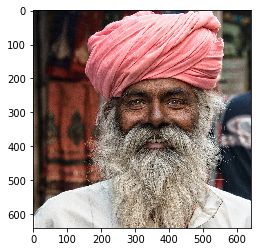

Path: ./my_images/human-613601_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


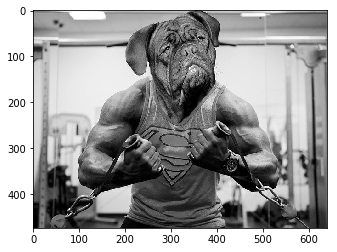

Path: ./my_images/bordeaux-963810_640.jpg
Dog detected on image
Dog breed:  Dogue de bordeaux
-------------------------------
------------------------------


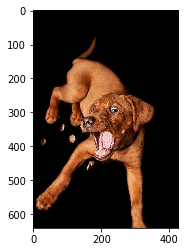

Path: ./my_images/dog-5021242_640.jpg
Dog detected on image
Dog breed:  Dogue de bordeaux
-------------------------------
------------------------------


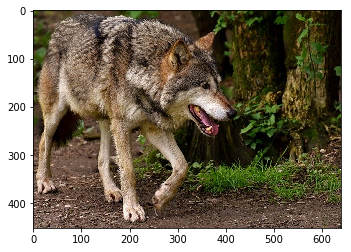

Path: ./my_images/wolf-3151876_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


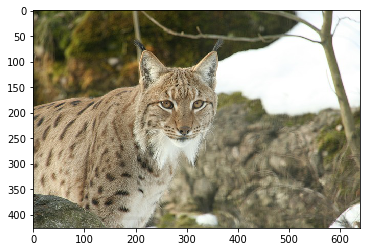

Path: ./my_images/lynx-940357_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


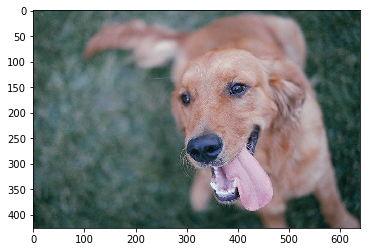

Path: ./my_images/dog-867236_640.jpg
Dog detected on image
Dog breed:  Golden retriever
-------------------------------
------------------------------


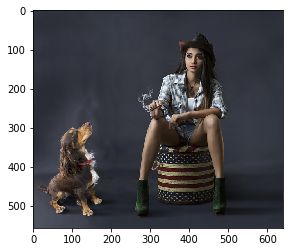

Path: ./my_images/fashion-3169951_640.jpg
human face(s) detected in image
Dog detected on image
Dog breed:  Dachshund
-------------------------------
------------------------------


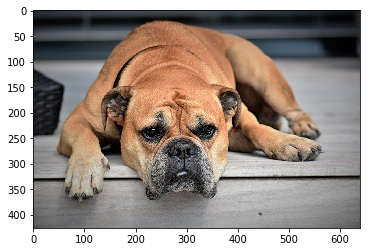

Path: ./my_images/dog-2437110_640.jpg
Dog detected on image
Dog breed:  Bulldog
-------------------------------
------------------------------


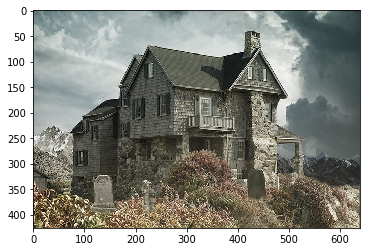

Path: ./my_images/house-2187170_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


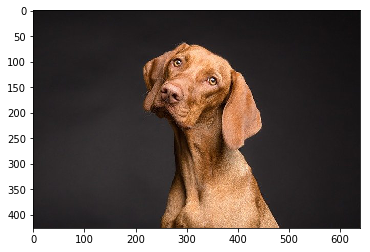

Path: ./my_images/dog-3277416_640.jpg
Dog detected on image
Dog breed:  Dogue de bordeaux
-------------------------------
------------------------------


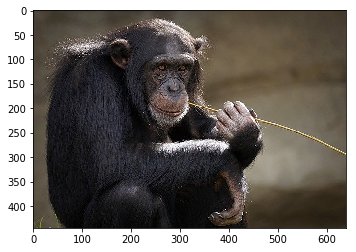

Path: ./my_images/chimpanzee-3703230_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


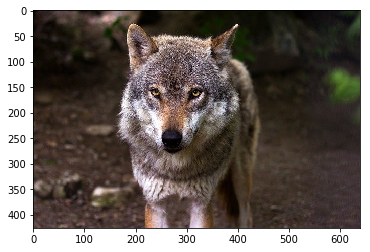

Path: ./my_images/wolf-635063_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


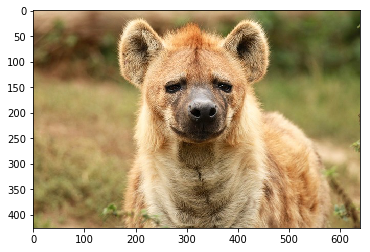

Path: ./my_images/hyena-3681274_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------


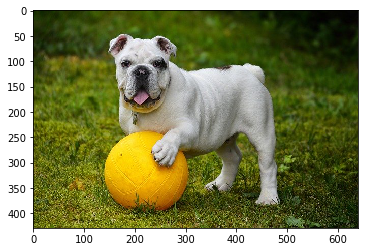

Path: ./my_images/english-bulldog-562723_640.jpg
Dog detected on image
Dog breed:  Bulldog
-------------------------------
------------------------------


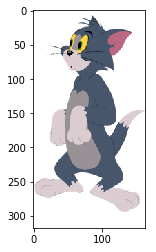

Path: ./my_images/tom.png
There is no human and dog in the image.
-------------------------------
------------------------------


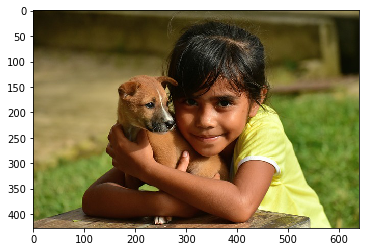

Path: ./my_images/puppy-3074154_640.jpg
human face(s) detected in image
-------------------------------
------------------------------


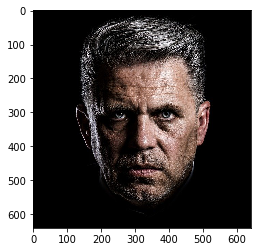

Path: ./my_images/man-852762_640.jpg
human face(s) detected in image
-------------------------------
------------------------------


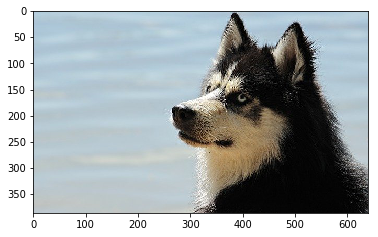

Path: ./my_images/husky-3380550_640.jpg
Dog detected on image
Dog breed:  Alaskan malamute
-------------------------------
------------------------------


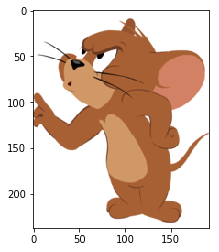

Path: ./my_images/jerry.png
There is no human and dog in the image.
-------------------------------
------------------------------


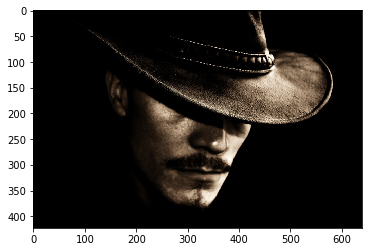

Path: ./my_images/man-20404_640.jpg
There is no human and dog in the image.
-------------------------------
------------------------------
error loading image:  ./my_images/.ipynb_checkpoints


In [52]:
import os
my_images = "./my_images"
for img_file in os.listdir(my_images):
    img_path = os.path.join(my_images, img_file)
    try:
        run_app(img_path, True)    
    except:
        print("error loading image: ", img_path)

Images taken from the pixabay.com
Mistakes can occur when people wear hats, glasses
To check the dogs, I took images of a wolf, lynx, hyena, cougar and cartoon characters. 